# Soccer Factor Model Out-of-Sample Predictions

## Data preparation

In [1]:
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import preliz as pz
import pymc as pm
import pytensor.tensor as pt
import seaborn as sns
import xarray as xr
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler

pm.__version__

'5.16.2+55.gb9fbfeda3.dirty'

In [2]:
az.style.use("arviz-whitegrid")
plt.rcParams["figure.figsize"] = [12, 5]
%config InlineBackend.figure_format = 'retina'
seed = sum(map(ord, "sfm"))
rng = np.random.default_rng(seed)

In [3]:
factors_numeric = ["points_diff"]
other_factors = ["center", "home_pitch"]
factors = other_factors + factors_numeric

In [4]:
complete_data = pd.read_csv("../../10_data/101_SFM/SFM_data_byPlayer.csv")

complete_data["goal"] = complete_data["goal"].astype(int)
complete_data["goals_in_match"] = complete_data["goals_in_match"].astype(int)

complete_data["kick_off"] = pd.to_datetime(
    complete_data["kick_off"], yearfirst=True
).dt.normalize()

# compute season number for each player, ~maturity of player
complete_data["season_nbr"] = complete_data.groupby(["name_player"])[
    "season"
].transform(lambda x: x.factorize(sort=True)[0])

# --- Compute share of games played as center or winger
complete_data["share_center"] = complete_data["N_games_center"] / complete_data[
    ["N_games_left", "N_games_center", "N_games_right"]
].sum(axis=1)
# --- Unfortunately: drop NAs...
complete_data = complete_data.dropna(subset="share_center").reset_index(drop=True)

# idiosyncracy: remove Henry's last games in 2011/12
complete_data = complete_data[
    ~(
        (complete_data["name_player"] == "thierry-henry")
        & (complete_data["season"] == "2011/12")
    )
]

complete_data = complete_data.sort_values(["name_player", "kick_off"]).reset_index(
    drop=True
)
complete_data

,goal,goals_in_match,goals_in_first_half,goals_in_second_half,goals_scored_avg_minutes_left,points_team,points_opp,goalsscored_inGame_team,goalsscored_inGame_opp,goalsscored_cum_team,...,goalsconceded_rank_team,goalsscored_diff,goal_balance_team,goal_balance_opp,goal_balance_diff,points_diff,goalsscored_share_player_team,name_player,season_nbr,share_center
0,0,0,0.0,0.0,0.0,0.0,0.0,2.0,4.0,0.0,...,NaN,0.0,0.0,0.0,0.0,0.0,0.000000,adam-szalai,0,0.875
1,0,0,0.0,0.0,0.0,24.0,17.0,1.0,0.0,23.0,...,11.0,2.0,-3.0,-9.0,6.0,7.0,0.000000,adam-szalai,0,0.875
2,0,0,0.0,0.0,0.0,27.0,39.0,0.0,3.0,24.0,...,11.0,-15.0,-2.0,22.0,-24.0,-12.0,0.000000,adam-szalai,0,0.875
3,0,0,0.0,0.0,0.0,27.0,25.0,1.0,0.0,24.0,...,11.0,-5.0,-5.0,-5.0,0.0,2.0,0.000000,adam-szalai,0,0.875
4,0,0,0.0,0.0,0.0,30.0,11.0,1.0,1.0,25.0,...,10.5,8.0,-4.0,-24.0,20.0,19.0,0.000000,adam-szalai,0,0.875
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33673,0,0,0.0,0.0,0.0,80.0,47.0,3.0,0.0,64.0,...,2.0,3.0,33.0,-1.0,34.0,33.0,0.140625,zlatan-ibrahimovic,12,1.000
33674,0,0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,...,NaN,0.0,0.0,0.0,0.0,0.0,0.000000,zlatan-ibrahimovic,13,1.000
33675,0,0,0.0,0.0,0.0,47.0,28.0,1.0,2.0,41.0,...,10.0,14.0,11.0,-3.0,14.0,19.0,0.000000,zlatan-ibrahimovic,13,1.000
33676,0,0,0.0,0.0,0.0,47.0,25.0,1.0,1.0,42.0,...,11.0,14.0,10.0,-16.0,26.0,22.0,0.000000,zlatan-ibrahimovic,13,1.000


In [5]:
players_ordered = complete_data["name_player"].sort_values().unique()
players_ordered.shape

(144,)

In [6]:
assert complete_data["name_player"].sort_values().unique().shape[0] == len(
    players_ordered
)

In [7]:
# lump together values >= 3
complete_data["goals_cats"] = np.where(
    complete_data["goals_in_match"] >= 3, 3, complete_data["goals_in_match"]
)

## Train-test split

In [8]:
# each player's last season
players_last_season = complete_data.groupby("name_player")["season_nbr"].max()

# make sure OOS-Set features only players which are in the Training-Set as well
players_last_season = players_last_season.loc[
    players_last_season.index.isin(pd.unique(complete_data["name_player"]))
]

# get OOS data
data_oos = complete_data[
    complete_data[["name_player", "season_nbr"]]
    .apply(tuple, axis=1)
    .isin(zip(list(players_last_season.index), list(players_last_season.values)))
]

# eliminate OOS data from 'training-set'
data_train = complete_data.drop(index=data_oos.index)

In [9]:
assert not (any(data_train.index.isin(data_oos.index)))

In [10]:
data_train = data_train.reset_index(drop=True)
data_oos = data_oos.reset_index(drop=True)

In [11]:
assert data_train["name_player"].sort_values().unique().shape[0] == len(players_ordered)

AssertionError: 

### Factor standardization

In [12]:
factors_numeric_train = data_train[factors_numeric]

scaler = StandardScaler()
# Fit the scaler on the training data and transform the data
factors_numeric_sdz_train = pd.DataFrame(
    scaler.fit_transform(factors_numeric_train), columns=factors_numeric
)

# Add the non-numeric factor to the standardized DataFrame
factors_sdz_train = factors_numeric_sdz_train.copy()
factors_sdz_train[other_factors] = data_train[["share_center", "home_pitch"]]

# make sure the order is the same as the PyMC coords later on
factors_sdz_train = factors_sdz_train[factors]

# --- Also standardize the OOS-Data
data_oos.loc[:, factors_numeric] = scaler.transform(data_oos[factors_numeric])

array([[<Axes: title={'center': 'points_diff'}>]], dtype=object)

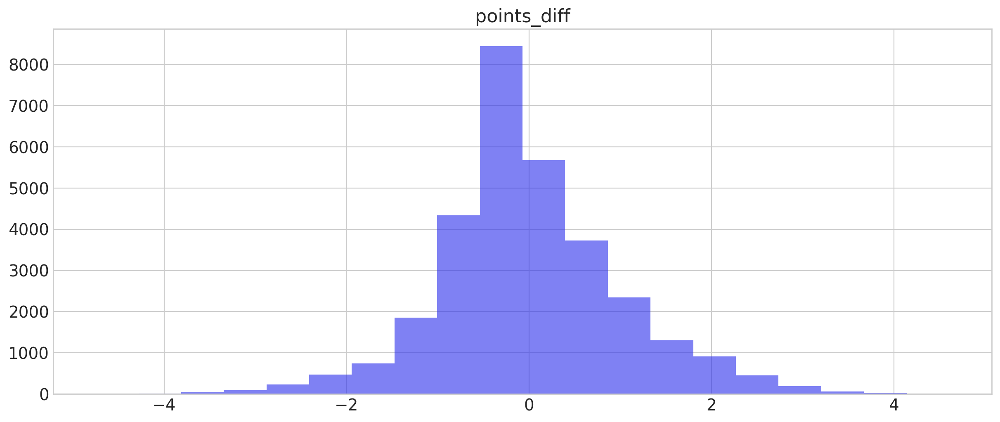

In [13]:
factors_numeric_sdz_train.hist(alpha=0.6, bins=20)

## HSGP Parameters

### Choosing the approximation parameters

HSGP is mainly defined by two parameters, `m` and `c`, respectively the number of basis vectors and the multiplier determining the boundary of the approximation (see [this](https://www.pymc.io/projects/examples/en/latest/gaussian_processes/HSGP-Basic.html) for more details). PyMC actually has a helper function to help us choose `m` and `c`:

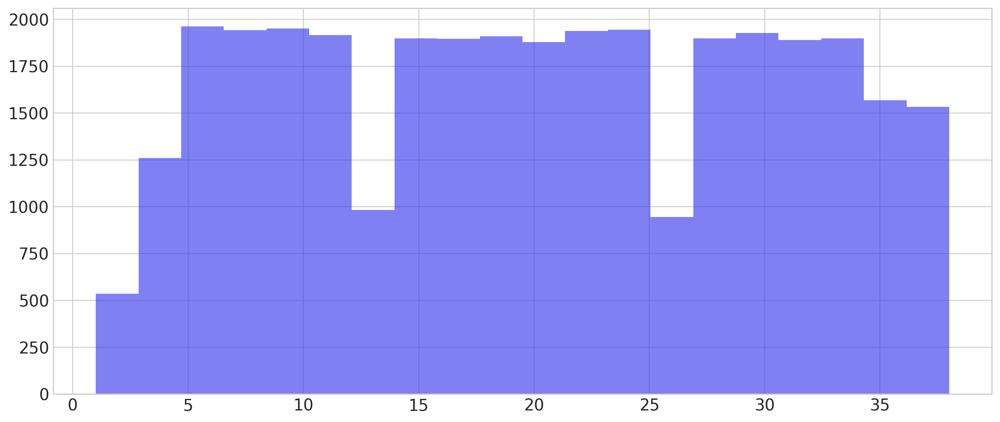

In [14]:
complete_data.gameday.hist(alpha=0.6, bins=20);

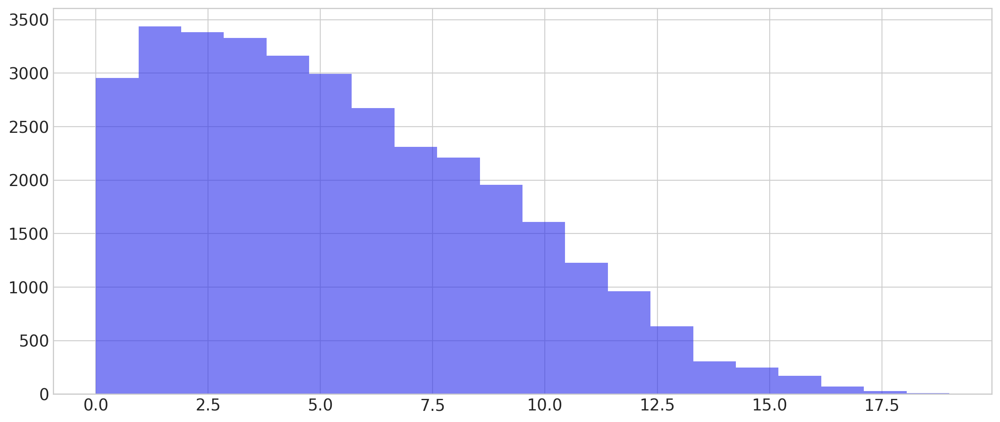

In [15]:
complete_data.season_nbr.hist(alpha=0.6, bins=20);

In [14]:
m_within, c_within = pm.gp.hsgp_approx.approx_hsgp_hyperparams(
    x_range=[0, complete_data.gameday.max()],
    lengthscale_range=[5, 25],
    cov_func="matern52",
)

print("Recommended smallest number of basis vectors (m):", m_within)
print("Recommended smallest scaling factor (c):", np.round(c_within, 1))

m_long, c_long = pm.gp.hsgp_approx.approx_hsgp_hyperparams(
    x_range=[0, complete_data.season_nbr.max()],
    lengthscale_range=[2, 6],
    cov_func="matern52",
)

print("Recommended smallest number of basis vectors (m):", m_long)
print("Recommended smallest scaling factor (c):", np.round(c_long, 1))

Recommended smallest number of basis vectors (m): 54
Recommended smallest scaling factor (c): 5.4
Recommended smallest number of basis vectors (m): 32
Recommended smallest scaling factor (c): 2.6


[Text(0.5, 1.0, 'Short/Mid Lengthscales Priors'), Text(0.5, 0, 'days')]

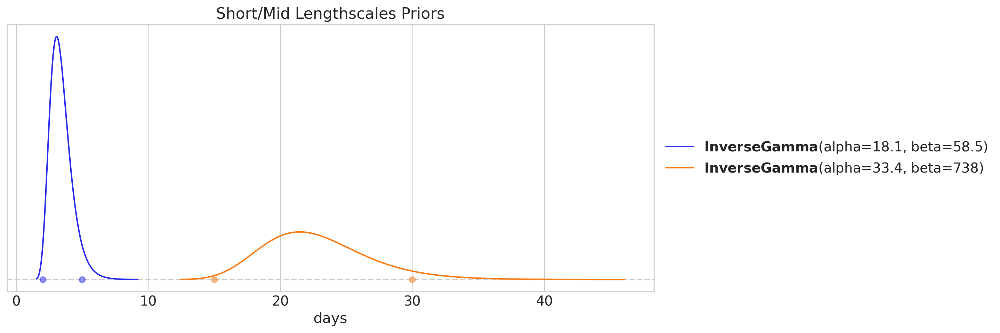

In [15]:
ls_short_dist, _ = pz.maxent(pz.InverseGamma(), 2, 5)
ls_medium_dist, ax = pz.maxent(pz.InverseGamma(), 15, 30)
ax.set(title="Short/Mid Lengthscales Priors", xlabel="days")

[Text(0.5, 1.0, 'Long Lengthscales Priors'), Text(0.5, 0, 'season')]

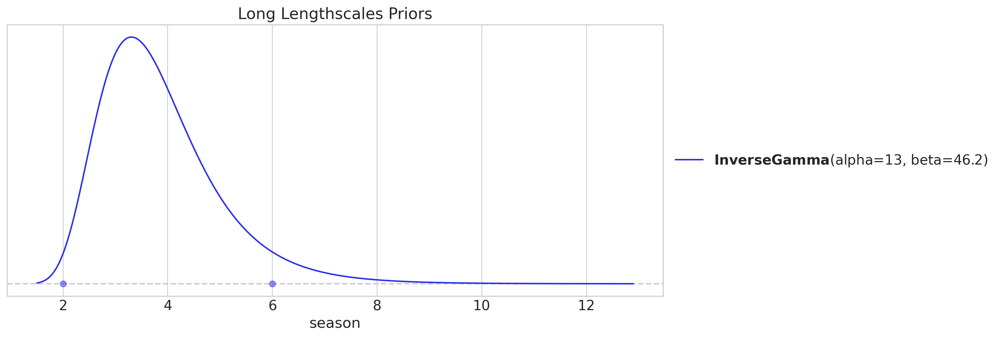

In [16]:
ls_long_dist, ax = pz.maxent(pz.InverseGamma(), 2, 6)
ax.set(title="Long Lengthscales Priors", xlabel="season")

## PyMC Model

In [17]:
# these don't change between train and test
unique_gamedays = complete_data["gameday"].sort_values().unique()
unique_seasons = complete_data["season_nbr"].sort_values().unique()

In [18]:
# these do change
player_idx = pd.Categorical(data_train["name_player"], categories=players_ordered).codes
gameday_idx = pd.Categorical(
    data_train["gameday"],
    categories=unique_gamedays,
).codes

COORDS = {
    "event": complete_data["goals_cats"].factorize(sort=True)[1],
    "factor": factors,
    "gameday": unique_gamedays,
    "obs_id": data_train.index,
    "player": players_ordered,
    "season": unique_seasons,
    "timescale": ["short", "medium", "long"],
}

Then, let's define the data containers for our model:

### Data containers

In [19]:
with pm.Model(coords=COORDS) as SFM_rlp:

    # Data containers
    factor_data = pm.Data(
        "factor_data", factors_sdz_train.to_numpy(), dims=("obs_id", "factor")
    )
    gameday_id = pm.Data("gameday_id", gameday_idx, dims="obs_id")
    player_id = pm.Data("player_id", player_idx, dims="obs_id")
    season_id = pm.Data("season_id", data_train["season_nbr"].to_numpy(), dims="obs_id")
    goals_obs = pm.Data("goals_obs", data_train["goals_cats"].to_numpy(), dims="obs_id")

### Players' skills

For the priors we use [those recommendations](https://github.com/stan-dev/stan/wiki/Prior-Choice-Recommendations).

In [20]:
with SFM_rlp:
    intercept_sigma = 5
    sd = pm.Exponential("player_effect_diversity", 1)

    baseline_sigma = pt.sqrt(intercept_sigma**2 + sd**2 / len(COORDS["player"]))
    baseline = baseline_sigma * pm.Normal("baseline")

    player_effect = pm.Deterministic(
        "player_effect",
        baseline + pm.ZeroSumNormal("player_effect_raw", sigma=sd, dims="player"),
        dims="player",
    )

### HSGPs

#### Defining the HSGPs

In [21]:
with SFM_rlp:
    X_gamedays = pm.Data("X_gamedays", unique_gamedays, dims="gameday")[:, None]
    X_seasons = pm.Data("X_seasons", unique_seasons, dims="season")[:, None]

    ## 1% chance that amplitude > 2 goals
    alpha_scale, upper_scale = 0.01, 2.0
    amplitude = pm.Exponential(
        "amplitude", lam=-np.log(alpha_scale) / upper_scale, dims="timescale"
    )
    ls = pm.InverseGamma(
        "ls",
        alpha=np.array([ls_short_dist.alpha, ls_medium_dist.alpha, ls_long_dist.alpha]),
        beta=np.array([ls_short_dist.beta, ls_medium_dist.beta, ls_long_dist.beta]),
        dims="timescale",
    )

    # cov matrices
    cov_short = amplitude[0] ** 2 * pm.gp.cov.Matern52(input_dim=1, ls=ls[0])
    cov_medium = amplitude[1] ** 2 * pm.gp.cov.Matern52(input_dim=1, ls=ls[1])
    cov_within = cov_short + cov_medium
    cov_long = amplitude[2] ** 2 * pm.gp.cov.Matern52(input_dim=1, ls=ls[2])

    ## GPs
    gp_within = pm.gp.HSGP(m=[m_within], c=c_within, cov_func=cov_within)
    basis_vectors_within, sqrt_psd_within = gp_within.prior_linearized(X=X_gamedays)
    basis_coeffs_within = pm.Normal(
        "basis_coeffs_within", shape=gp_within.n_basis_vectors
    )
    f_within = pm.Deterministic(
        "f_within",
        basis_vectors_within @ (basis_coeffs_within * sqrt_psd_within),
        dims="gameday",
    )

    gp_long = pm.gp.HSGP(m=[m_long], c=c_long, cov_func=cov_long)
    basis_vectors_long, sqrt_psd_long = gp_long.prior_linearized(X=X_seasons)
    basis_coeffs_long = pm.Normal("basis_coeffs_long", shape=gp_long.n_basis_vectors)
    f_long = pm.Deterministic(
        "f_long",
        basis_vectors_long @ (basis_coeffs_long * sqrt_psd_long),
        dims="season",
    )

### Regression for player skills

In [22]:
with SFM_rlp:
    alpha = pm.Deterministic(
        "alpha",
        player_effect[player_id] + f_within[gameday_id] + f_long[season_id],
        dims="obs_id",
    )

### Adding team factors

> Partially pooled across teams

In [23]:
with SFM_rlp:
    slope = pm.Normal("slope", sigma=2.5, dims="factor")

### Likelihood

In [24]:
empirical_probs = data_train["goals_cats"].value_counts(normalize=True).to_numpy()
cumulative_probs = empirical_probs.cumsum()[
    :-1
]  # get cumulative probabilities except the last one (which will be 1)

# inverse CDF of standard normal to convert to latent scale cutpoints
cutpoints_mu_standard = norm.ppf(cumulative_probs)

# Compute differences between cutpoints
delta_prior = np.diff(cutpoints_mu_standard)

with SFM_rlp:
    # regression
    eta = pm.Deterministic("eta", alpha + pm.math.dot(factor_data, slope), dims="obs_id")

    # prior on cutpoints
    #diversity = pm.Gamma("cutpoints_diversity", diversity_dist.alpha, diversity_dist.beta)
    #diversity = pm.Exponential("cutpoints_diversity", 1)
    # non-centered?
    # cutpoints = pm.Normal(
    #     "cutpoints",
    #     #mu=[1, 9, 15],
    #     #mu=cutpoints_mu_standard * diversity,
    #     sigma=diversity,
    #     transform=pm.distributions.transforms.ordered,
    # )

    # Priors for a and b based on cumulative probabilities
    a = pm.Normal("a_cutpoints", mu=10, sigma=1)  # Center around first cutpoint
    b = pm.Normal("b_cutpoints", mu=15, sigma=0.5) # Average difference between cutpoints

    cutpoints = pm.Normal(
        "cutpoints", 
        mu=a + b * np.arange(0, 3), 
        sigma=0.1, 
        shape=3,
        transform=pm.distributions.transforms.ordered,
    )
    # Hyperpriors for cutpoints (shared across players)
# a = pm.Normal("a_cutpoints", mu=0, sigma=10)  # Intercept for cutpoints
# b = pm.Normal("b_cutpoints", mu=0, sigma=2)   # Slope for cutpoints
# sigma_cutpoints = pm.Exponential("sigma_cutpoints", lam=1.0)

# # Player-specific cutpoints
# cutpoints = pm.Normal(
#     "cutpoints", 
#     mu=a + b * np.arange(1, K)[None, :],  # Linear trend shared across players
#     sigma=sigma_cutpoints, 
#     shape=(n_players, K-1),  # Player-specific cutpoints
#     dims=("player", "cutpoint"),
# )

    # likelihood
    pm.OrderedLogistic(
        "goals_scored",
        cutpoints=cutpoints,
        eta=eta,
        observed=goals_obs,
        dims="obs_id",
    )

In [25]:
with SFM_rlp:
    # regression
    eta = pm.Deterministic(
        "eta", alpha + pm.math.dot(factor_data, slope), dims="obs_id"
    )

    # Hyperpriors for the differences between cutpoints (delta)
    cutpoint_offset = 4
    delta_mean = pm.Normal(
        "delta_mean", mu=delta_prior * cutpoint_offset, sigma=1, shape=2
    )  # Mean of differences across all players
    delta_sigma = pm.Exponential(
        "delta_sigma", 1, shape=2
    )  # Variation of the differences

    # Player-specific differences (delta)
    delta_player = delta_mean + delta_sigma * pm.Normal(
        "delta_player", shape=(len(COORDS["player"]), 2)
    )

    # Cumulative sum to construct cutpoints
    # Ensure differences are positive using softplus
    # dims=("player", "cutpoint")
    cutpoints = pm.Deterministic(
        "cutpoints",
        pt.concatenate(
            [
                pt.full((player_effect.shape[0], 1), cutpoint_offset),
                pt.cumsum(pt.softplus(delta_player), axis=-1) + cutpoint_offset,
            ],
            axis=-1,
        ),  # Start at cutpoint_offset and sum differences
    )

    # likelihood
    pm.OrderedLogistic(
        "goals_scored",
        cutpoints=cutpoints[player_id],
        eta=eta,
        observed=goals_obs,
        dims="obs_id",
    )

## Model graph

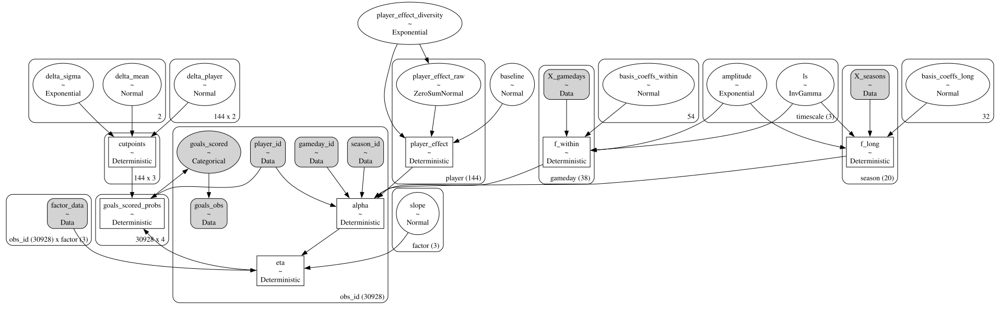

In [26]:
pm.model_to_graphviz(SFM_rlp)

## Prior Predictive Sampling

In [56]:
with SFM_rlp:
    idata = pm.sample_prior_predictive()

Sampling: [amplitude, baseline, basis_coeffs_long, basis_coeffs_within, delta_mean, delta_player, delta_sigma, goals_scored, ls, player_effect_diversity, player_effect_raw, slope]


In [28]:
idata.prior = idata.prior.rename({"goals_scored_probs_dim_1": "event"})

mindex_coords_original = xr.Coordinates.from_pandas_multiindex(
    data_train.set_index(["name_player", "season", "gameday"]).index,
    "obs_id",
)

idata.prior = idata.prior.assign_coords(mindex_coords_original)
idata.prior_predictive = idata.prior_predictive.assign_coords(mindex_coords_original)
idata.observed_data = idata.observed_data.assign_coords(mindex_coords_original)

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

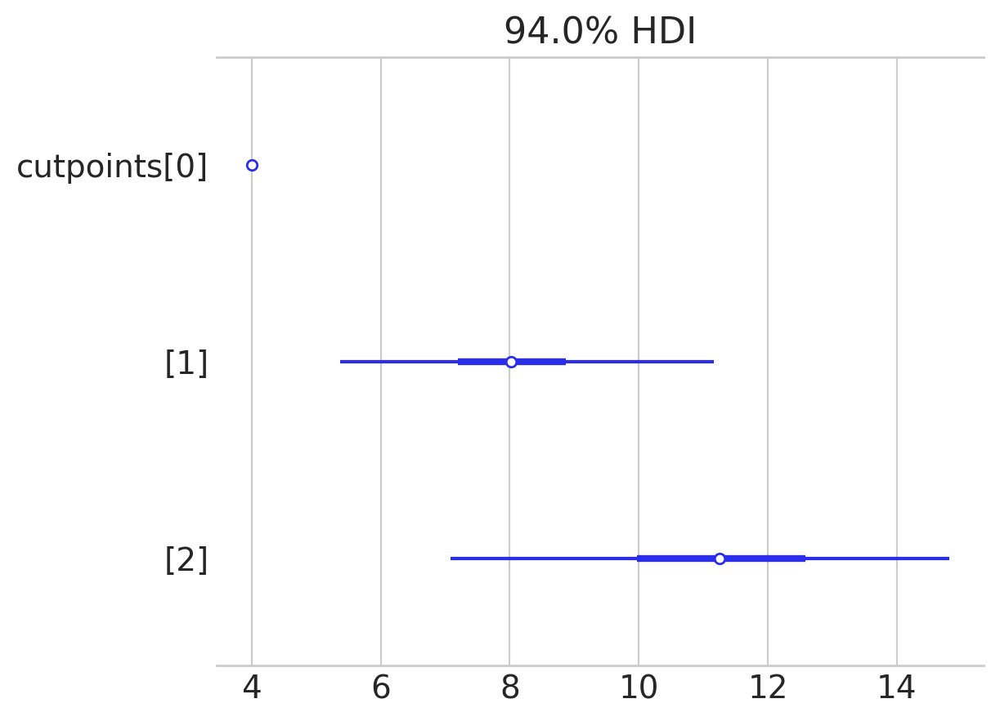

In [29]:
az.plot_forest(idata.prior["cutpoints"].sel(cutpoints_dim_0=0))

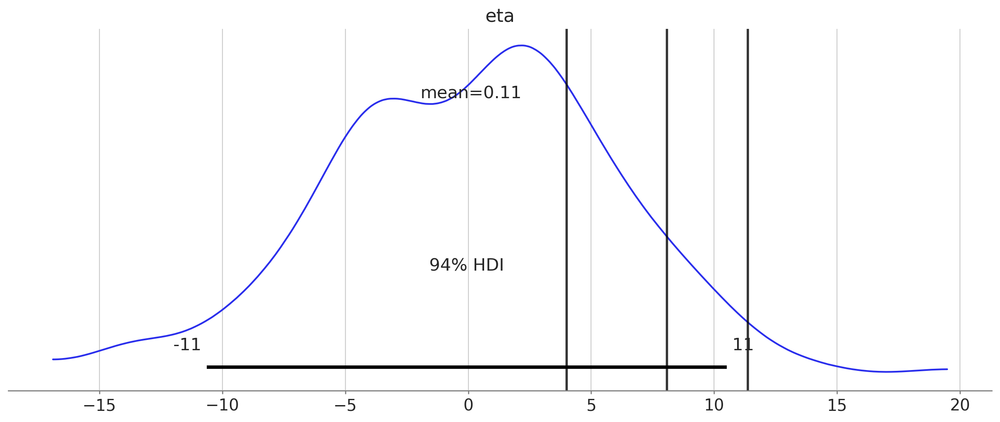

In [30]:
K = len(idata.prior["cutpoints"].cutpoints_dim_1)

ax = az.plot_posterior(idata.prior["eta"].isel(obs_id=0))
for i in range(K):
    ax.axvline(
        idata.prior["cutpoints"].isel(cutpoints_dim_0=0, cutpoints_dim_1=i).mean().data,
        color="k",
        lw=2,
        alpha=0.8,
    )

In [31]:
implied_probs_prior = (
    az.extract(idata.prior, var_names="goals_scored_probs")
    .rename({"goals_scored_probs_dim_0": "obs_id"})
    .assign_coords(mindex_coords_original)
)

Text(0.5, 0.98, 'Prior probability of each event')

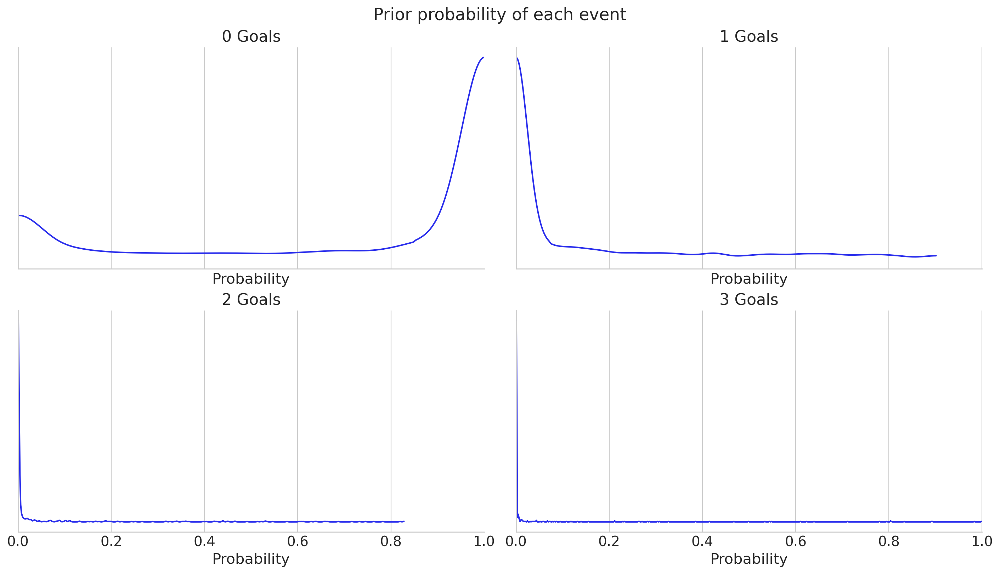

In [32]:
_, axes = plt.subplots(2, 2, figsize=(14, 8), sharex=True, layout="constrained")
axes = axes.flatten()

for i, ax in enumerate(axes):
    az.plot_dist(implied_probs_prior.isel(obs_id=0, event=i), ax=ax)
    ax.set(xlabel="Probability", yticklabels="", title=f"{i} Goals", xlim=[0, 1])
    ax.set_yticks([])
    sns.despine()
plt.suptitle("Prior probability of each event", fontsize=17)

In [33]:
implied_class = az.extract(idata.prior_predictive, var_names="goals_scored")

[Text(0.5, 0, 'Goals'),
 Text(0, 0.5, 'Proportion'),
 Text(0.5, 1.0, 'Prior allocation of goals for observation 0')]

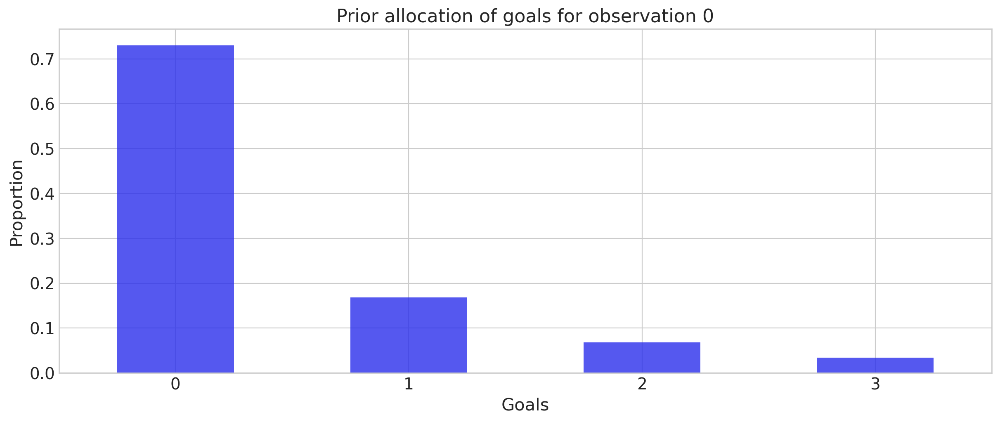

In [34]:
ax = (
    implied_class.isel(obs_id=0)
    .to_pandas()
    .reset_index(drop=True)
    .value_counts(normalize=True)
    .sort_index()
    .plot(kind="bar", rot=0, alpha=0.8)
)
ax.set(
    xlabel="Goals",
    ylabel="Proportion",
    title="Prior allocation of goals for observation 0",
)

### Prior predictive checks

[Text(0.5, 0, 'Goals scored'), Text(0.5, 1.0, 'Prior Predictive Checks')]

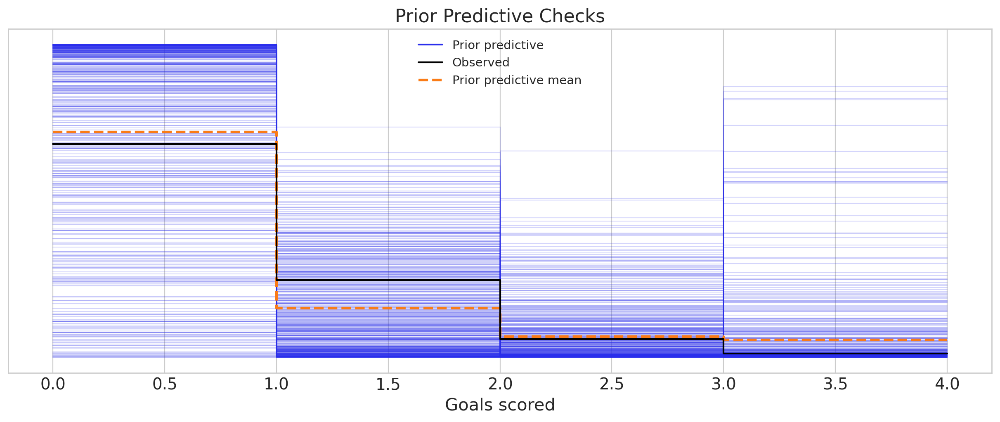

In [35]:
ax = az.plot_ppc(idata, group="prior", observed=True)
ax.set(xlabel="Goals scored", title="Prior Predictive Checks")

## Sampling and convergence checks

In [57]:
with SFM_rlp:
    idata.extend(
        pm.sample(nuts_sampler="numpyro", tune=500, chains=6, target_accept=0.99)
    )

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

/Users/alex_andorra/mambaforge/envs/football-models/lib/python3.12/site-packages/jax/_src/interpreters/mlir.py:930: UserWarning: Some donated buffers were not usable: ShapedArray(float64[6,1000,143]).
See an explanation at https://jax.readthedocs.io/en/latest/faq.html#buffer-donation.
  warnings.warn("Some donated buffers were not usable:"


In [41]:
import nutpie
from pymc.model.transform.optimization import freeze_dims_and_data

In [53]:
compiled_model = nutpie.compile_pymc_model(
    freeze_dims_and_data(SFM_rlp),
    backend="JAX",
)
sampler = nutpie.sample(
    compiled_model,
    blocking=False,
    save_warmup=False,
    store_unconstrained=False,
    store_divergences=False,
    target_accept=0.99,
)
idata.extend(sampler.wait())

Progress,Draws,Divergences,Step Size,Gradients/Draw
,1300,0,0.06,63
,1300,0,0.06,63
,1300,0,0.06,63
,1300,0,0.06,63
,1300,0,0.05,127
,1300,0,0.06,63


In [58]:
ess = az.ess(idata.posterior)

In [59]:
ess.quantile([0.01, 0.5, 0.99]).to_dataframe().astype(int).style.background_gradient(
    axis=None, cmap="RdYlGn"
)

,alpha,amplitude,baseline,basis_coeffs_long,basis_coeffs_within,cutpoints,delta_mean,delta_player,delta_sigma,eta,f_long,f_within,goals_scored_probs,ls,player_effect,player_effect_diversity,player_effect_raw,slope
quantile,,,,,,,,,,,,,,,,,,
0.010000,6253,2546,3245,5974,8393,6000,4054,8296,2631,8413,4089,5070,8188,4465,3533,4645,8070,3934
0.500000,8816,2727,3245,9535,11187,10092,4726,11393,2808,10937,4298,5259,10939,10719,4110,4645,11203,8665
0.990000,13806,3169,3245,14177,13381,13940,5397,14768,2986,13935,6310,5489,14537,13537,6759,4645,13725,11906


In [65]:
var_names = [RV.name for RV in SFM_rlp.free_RVs if RV.eval().size <= 3]

In [73]:
az.plot_ess(
    idata,
    kind="evolution",
    var_names=var_names,
    grid=(8, 2),
    textsize=25,
    min_ess=600,
);

array([[<Axes: title={'center': 'player_effect_diversity'}, xlabel='Total number of draws', ylabel='ESS'>,
        <Axes: title={'center': 'baseline'}, xlabel='Total number of draws', ylabel='ESS'>],
       [<Axes: title={'center': 'amplitude\nshort'}, xlabel='Total number of draws', ylabel='ESS'>,
        <Axes: title={'center': 'amplitude\nmedium'}, xlabel='Total number of draws', ylabel='ESS'>],
       [<Axes: title={'center': 'amplitude\nlong'}, xlabel='Total number of draws', ylabel='ESS'>,
        <Axes: title={'center': 'ls\nshort'}, xlabel='Total number of draws', ylabel='ESS'>],
       [<Axes: title={'center': 'ls\nmedium'}, xlabel='Total number of draws', ylabel='ESS'>,
        <Axes: title={'center': 'ls\nlong'}, xlabel='Total number of draws', ylabel='ESS'>],
       [<Axes: title={'center': 'slope\ncenter'}, xlabel='Total number of draws', ylabel='ESS'>,
        <Axes: title={'center': 'slope\nhome_pitch'}, xlabel='Total number of draws', ylabel='ESS'>],
       [<Axes: titl

<Axes: >

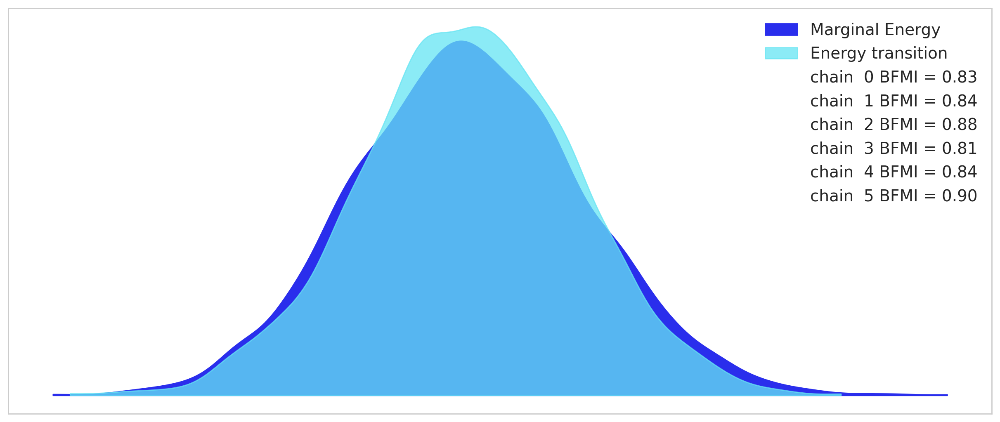

In [72]:
az.plot_energy(idata);

In [74]:
az.summary(
    idata,
    var_names=var_names,
    round_to=2,
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
player_effect_diversity,0.46,0.03,0.39,0.52,0.00,0.00,4645.58,4960.70,1.0
baseline,0.51,0.04,0.43,0.59,0.00,0.00,3245.39,2787.62,1.0
amplitude[short],0.03,0.02,0.00,0.07,0.00,0.00,3178.06,2907.69,1.0
amplitude[medium],0.12,0.09,0.00,0.28,0.00,0.00,2727.19,2638.37,1.0
amplitude[long],0.20,0.10,0.07,0.38,0.00,0.00,2542.52,2787.43,1.0
ls[short],3.47,0.89,2.03,5.10,0.01,0.01,10719.12,4451.24,1.0
ls[medium],23.61,4.30,16.36,31.90,0.04,0.03,13595.22,4570.15,1.0
ls[long],4.24,1.22,2.36,6.57,0.02,0.02,4338.15,3722.35,1.0
slope[center],0.36,0.06,0.24,0.47,0.00,0.00,3837.94,4827.18,1.0
slope[home_pitch],0.38,0.02,0.33,0.42,0.00,0.00,11972.34,4300.01,1.0


In [ ]:
az.r2_score(
    y_true=idata.observed_data["goals_scored"].data,
    y_pred=az.extract(idata.posterior_predictive, var_names="goals_scored").data.T,
).round(2)

r2        0.35
r2_std    0.00
dtype: float64

In [79]:
with SFM_rlp:
    idata.extend(
        pm.sample_posterior_predictive(idata, compile_kwargs={"mode": "NUMBA"})
    )

Sampling: [goals_scored]


Output()

<Axes: xlabel='goals_scored'>

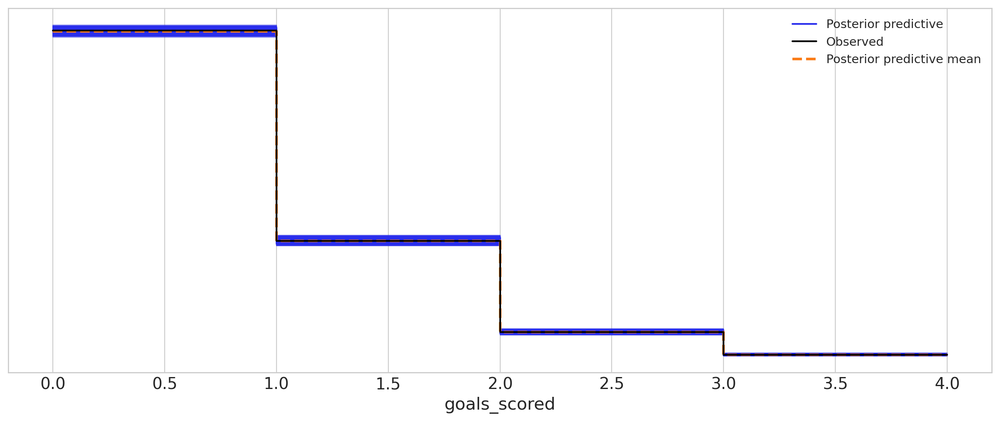

In [80]:
az.plot_ppc(idata)

<Axes: xlabel='Data Point', ylabel='Shape parameter k'>

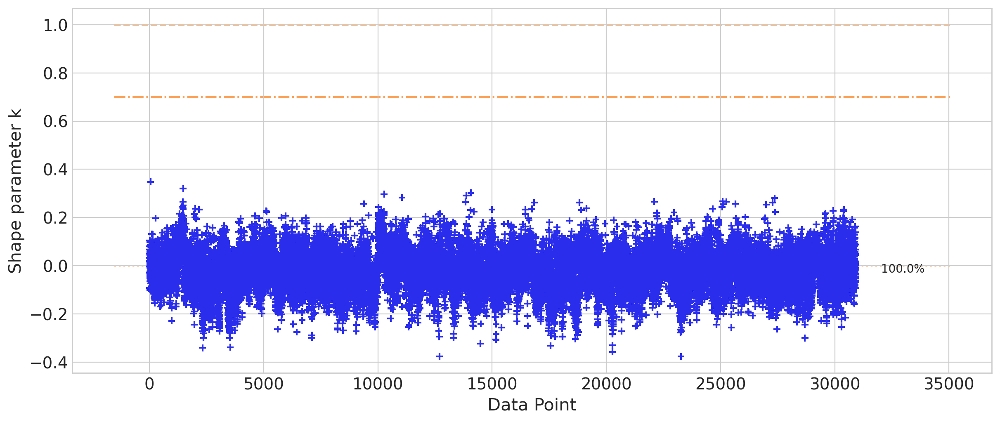

In [83]:
pm.compute_log_likelihood(idata, model=SFM_rlp, compile_kwargs={"mode": "NUMBA"})
# compute pointwise LOO:
# see this link for explanation:
# https://bambinos.github.io/bambi/notebooks/logistic_regression.html#hat-kappa-parameter
loo = az.loo(idata, pointwise=True)
# plot kappa values:
az.plot_khat(loo, show_hlines=True, show_bins=True)

/Users/alex_andorra/mambaforge/envs/football-models/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:700: RuntimeWarning: invalid value encountered in _beta_ppf
  return _boost._beta_ppf(q, a, b)


<Axes: xlabel='goals_scored'>

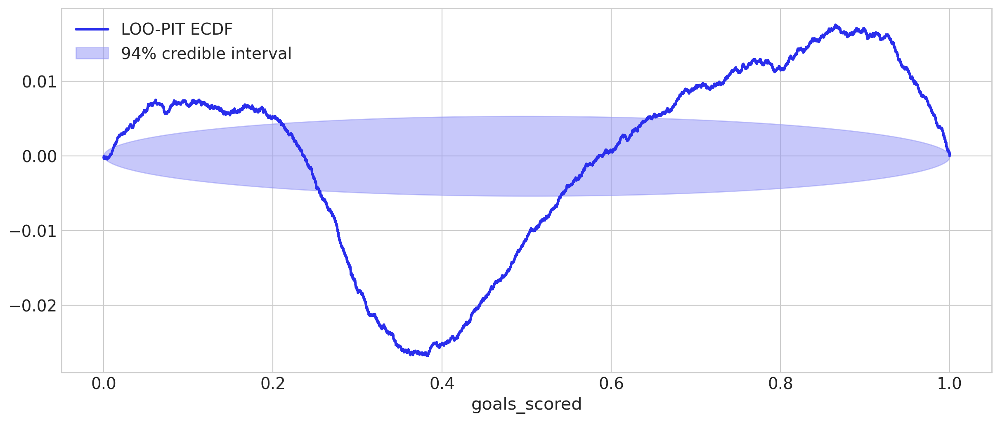

In [85]:
az.plot_loo_pit(idata=idata, y="goals_scored", ecdf=True)

<Axes: xlabel='goals_scored'>

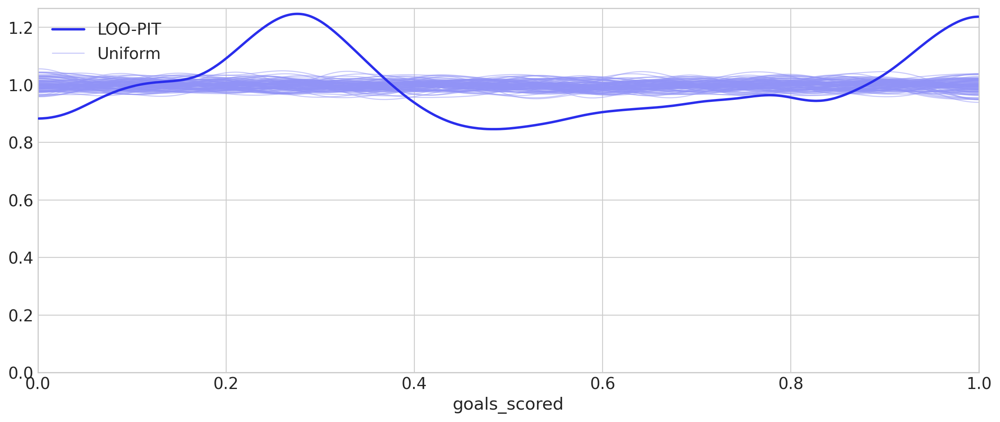

In [96]:
az.plot_loo_pit(idata=idata, y="goals_scored")

In [76]:
az.to_netcdf(idata, "idata_oos.nc")

'idata_oos.nc'

## Posterior parameters

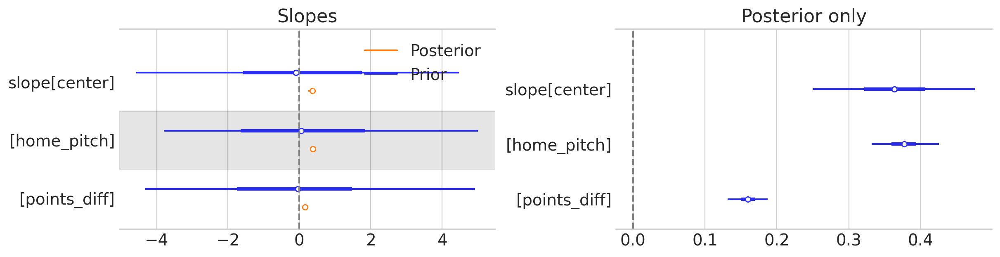

In [166]:
_, axes = plt.subplot_mosaic(
    """
    AB
    """,
    figsize=(12, 3),
    layout="constrained",
)

az.plot_forest(
    [idata.prior, idata.posterior],
    model_names=["Prior", "Posterior"],
    var_names=["slope"],
    combined=True,
    ax=axes["A"],
)
axes["A"].axvline(c="grey", ls="--")
axes["A"].set(title="Slopes")

az.plot_forest(
    idata,
    var_names=["slope"],
    combined=True,
    ax=axes["B"],
)
axes["B"].axvline(c="grey", ls="--")
axes["B"].set(title="Posterior only");

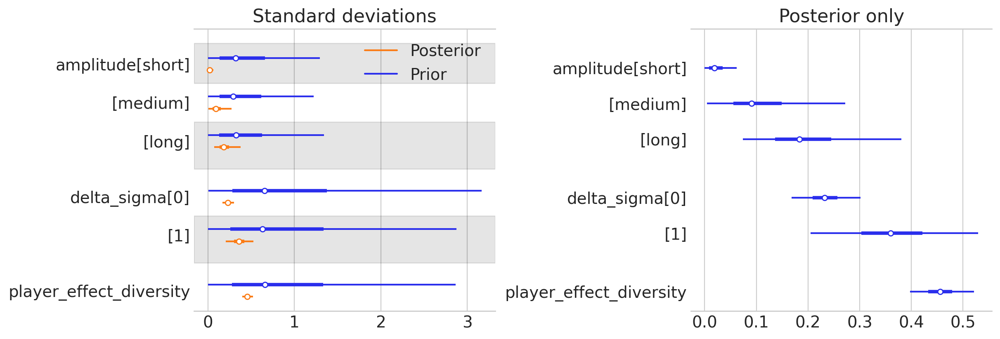

In [173]:
_, axes = plt.subplot_mosaic(
    """
    AB
    """,
    figsize=(12, 4),
    layout="constrained",
)

az.plot_forest(
    [idata.prior, idata.posterior],
    model_names=["Prior", "Posterior"],
    var_names=["diversity", "amplitude", "sd_", "_sigma"],
    combined=True,
    filter_vars="regex",
    ax=axes["A"],
)
axes["A"].set(title="Standard deviations")

az.plot_forest(
    idata,
    var_names=["diversity", "amplitude", "sd_", "_sigma"],
    combined=True,
    filter_vars="regex",
    ax=axes["B"],
)
axes["B"].set(title="Posterior only");

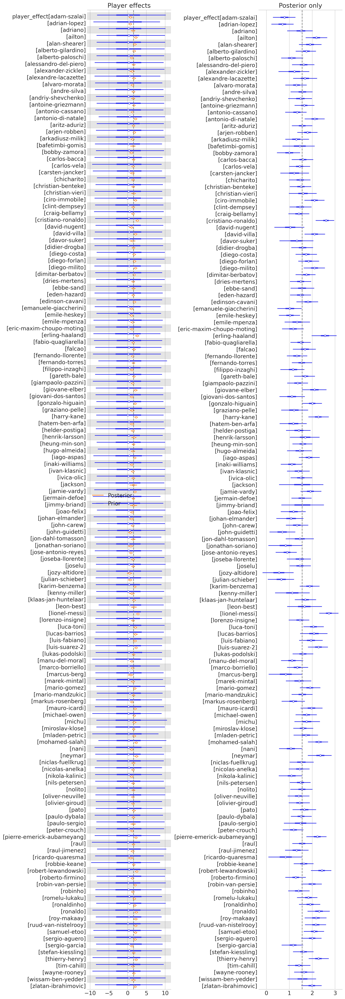

In [182]:
_, axes = plt.subplot_mosaic(
    """
    AB
    """,
    figsize=(12, 35),
    layout="constrained",
)

az.plot_forest(
    [idata.prior, idata.posterior],
    model_names=["Prior", "Posterior"],
    var_names="player_effect",
    combined=True,
    ax=axes["A"],
)
axes["A"].axvline(x=idata.posterior.player_effect.mean(), c="grey", ls="--")
axes["A"].set(title="Player effects")

az.plot_forest(
    idata,
    var_names="player_effect",
    combined=True,
    ax=axes["B"],
)
axes["B"].axvline(x=idata.posterior.player_effect.mean(), c="grey", ls="--")
axes["B"].set(title="Posterior only");

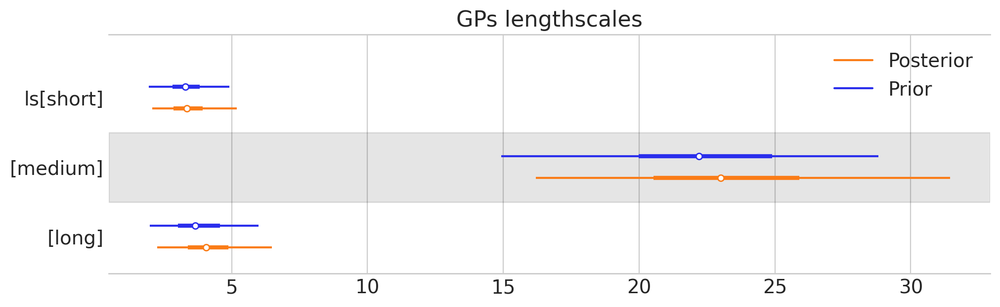

In [183]:
ax = az.plot_forest(
    [idata.prior, idata.posterior],
    model_names=["Prior", "Posterior"],
    var_names="ls",
    combined=True,
    figsize=(10, 3),
)
ax[0].set(title="GPs lengthscales");

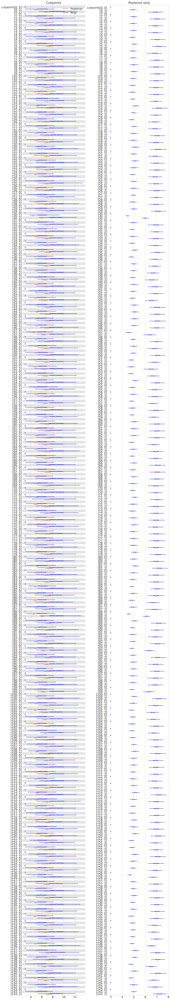

In [194]:
_, axes = plt.subplot_mosaic(
    """
    AB
    """,
    figsize=(12, 70),
    layout="constrained",
)
az.plot_forest(
    [idata.prior["cutpoints"], idata.posterior["cutpoints"]],
    combined=True,
    model_names=["Prior", "Posterior"],
    ax=axes["A"],
)
axes["A"].set(title="Cutpoints")
az.plot_forest(
    idata,
    var_names=["cutpoints"],
    combined=True,
    ax=axes["B"],
)
axes["B"].set(title="Posterior only");

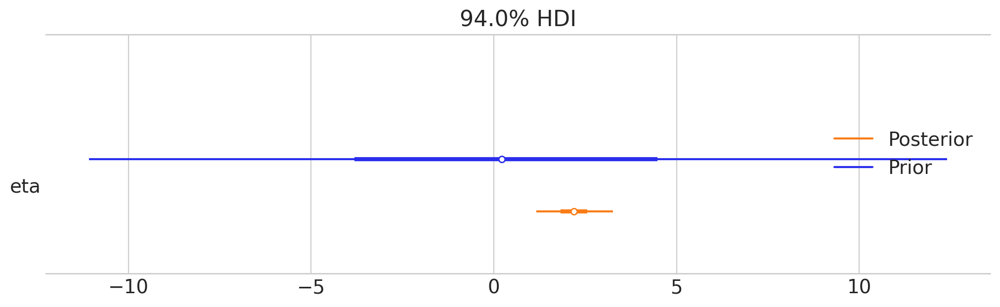

In [195]:
az.plot_forest(
    [idata.prior["eta"], idata.posterior["eta"]],
    combine_dims={"chain", "draw", "obs_id"},
    combined=True,
    model_names=["Prior", "Posterior"],
    figsize=(10, 3),
);

## Performance evolution through time

In [196]:
index = pd.MultiIndex.from_product(
    [unique_seasons, unique_gamedays],
    names=["season_nbr", "gameday"],
)
unique_combinations = pd.DataFrame(index=index).reset_index()

In [198]:
f_long_post = idata.posterior["f_long"]
f_within_post = idata.posterior["f_within"]

f_long_post_aligned = f_long_post.sel(
    season=unique_combinations["season_nbr"].to_numpy()
).rename({"season": "timestamp"})
f_long_post_aligned["timestamp"] = unique_combinations.index

f_within_post_aligned = f_within_post.sel(
    gameday=unique_combinations["gameday"].to_numpy()
).rename({"gameday": "timestamp"})
f_within_post_aligned["timestamp"] = unique_combinations.index

f_total_post = f_long_post_aligned + f_within_post_aligned

some_draws = rng.choice(4000, size=20, replace=True)

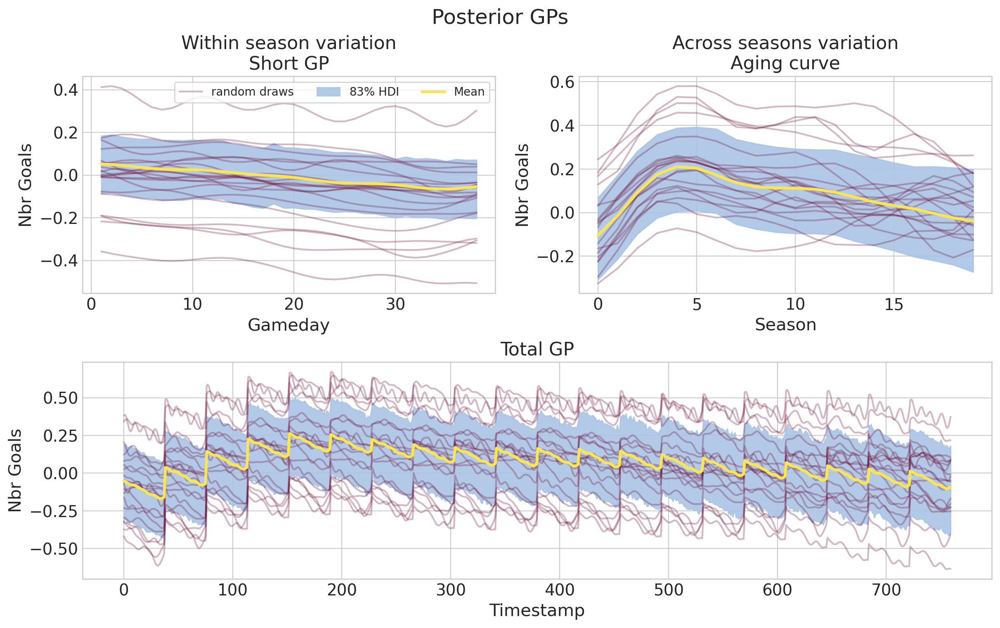

In [199]:
_, axes = plt.subplot_mosaic(
    """
    AB
    CC
    """,
    figsize=(12, 7.5),
    layout="constrained",
)

axes["A"].plot(
    f_within_post.gameday,
    az.extract(f_within_post)["f_within"].isel(sample=0),
    color="#70133A",
    alpha=0.3,
    lw=1.5,
    label="random draws",
)
axes["A"].plot(
    f_within_post.gameday,
    az.extract(f_within_post)["f_within"].isel(sample=some_draws),
    color="#70133A",
    alpha=0.3,
    lw=1.5,
)
az.plot_hdi(
    x=f_within_post.gameday,
    y=f_within_post,
    hdi_prob=0.83,
    color="#AAC4E6",
    fill_kwargs={"alpha": 0.9, "label": r"$83\%$ HDI"},
    ax=axes["A"],
    smooth=False,
)
axes["A"].plot(
    f_within_post.gameday,
    f_within_post.mean(("chain", "draw")),
    color="#FBE64D",
    lw=2.5,
    label="Mean",
)
axes["A"].set(
    xlabel="Gameday", ylabel="Nbr Goals", title="Within season variation\nShort GP"
)
axes["A"].legend(fontsize=10, frameon=True, ncols=3)

axes["B"].plot(
    f_long_post.season,
    az.extract(f_long_post)["f_long"].isel(sample=some_draws),
    color="#70133A",
    alpha=0.3,
    lw=1.5,
)
az.plot_hdi(
    x=f_long_post.season,
    y=f_long_post,
    hdi_prob=0.83,
    color="#AAC4E6",
    fill_kwargs={"alpha": 0.9},
    ax=axes["B"],
    smooth=False,
)
axes["B"].plot(
    f_long_post.season,
    f_long_post.mean(("chain", "draw")),
    color="#FBE64D",
    lw=2.5,
)
axes["B"].set(
    xlabel="Season", ylabel="Nbr Goals", title="Across seasons variation\nAging curve"
)

axes["C"].plot(
    f_total_post.timestamp,
    az.extract(f_total_post)["x"].isel(sample=some_draws),
    color="#70133A",
    alpha=0.3,
    lw=1.5,
)
az.plot_hdi(
    x=f_total_post.timestamp,
    y=f_total_post,
    hdi_prob=0.83,
    color="#AAC4E6",
    fill_kwargs={"alpha": 0.9},
    ax=axes["C"],
    smooth=False,
)
axes["C"].plot(
    f_total_post.timestamp,
    f_total_post.mean(("chain", "draw")),
    color="#FBE64D",
    lw=2.5,
)
axes["C"].set(xlabel="Timestamp", ylabel="Nbr Goals", title="Total GP")
plt.suptitle("Posterior GPs", fontsize=18);

## Out-Of-Sample Performance

In [200]:
with SFM_rlp:
    pm.set_data(
        coords={"obs_id": data_oos.index},
        new_data={
            "factor_data": data_oos[
                ["share_center", "home_pitch"] + factors_numeric
            ].to_numpy(),
            "gameday_id": pd.Categorical(
                data_oos["gameday"], categories=unique_gamedays
            ).codes,
            "player_id": pd.Categorical(
                data_oos["name_player"], categories=players_ordered
            ).codes,
            "season_id": data_oos["season_nbr"].to_numpy(),
            "goals_obs": np.zeros_like(
                data_oos["goals_cats"]
            ),  # just a placeholder for shape inference
        },
    )

In [201]:
with SFM_rlp:
    oos_preds = pm.sample_posterior_predictive(
        idata,
        var_names=["alpha", "goals_scored_probs", "goals_scored"],
        predictions=True,
        compile_kwargs={"mode": "NUMBA"},
    )

Sampling: [goals_scored]


Output()

In [202]:
mindex_coords = xr.Coordinates.from_pandas_multiindex(
    data_oos.set_index(["name_player", "season", "gameday"]).index,
    "obs_id",
)

oos_preds.predictions = oos_preds.predictions.assign_coords(mindex_coords)
oos_preds.predictions_constant_data = oos_preds.predictions_constant_data.assign_coords(
    mindex_coords
)

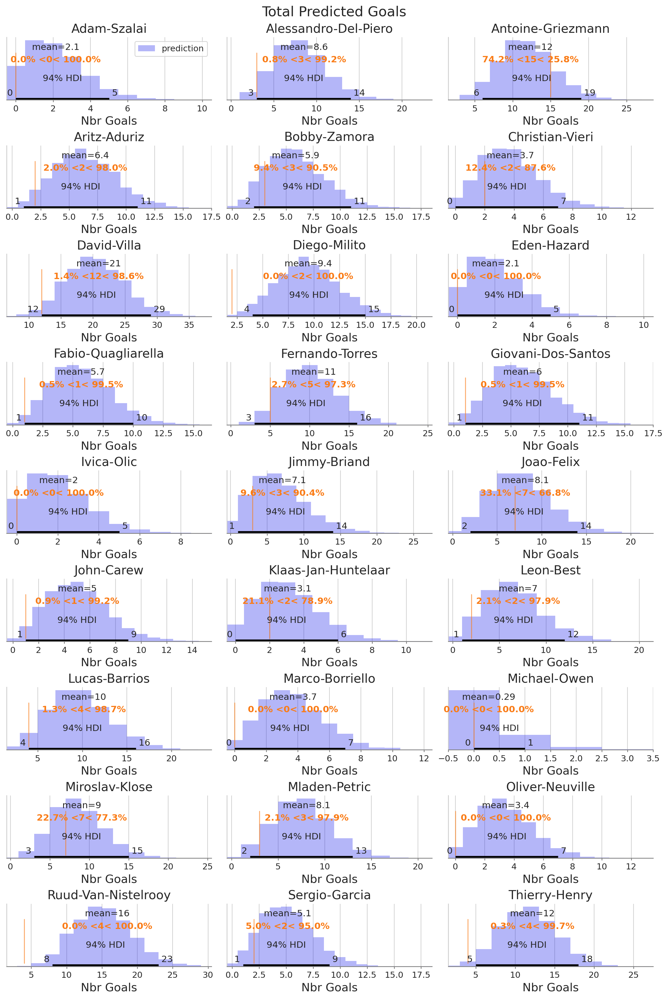

In [203]:
_, axes = plt.subplots(9, 3, figsize=(12, 18), layout="constrained")
axes = axes.flatten()

for player, (i, ax) in zip(
    np.sort(rng.choice(players_ordered, size=27, replace=False)), enumerate(axes)
):
    goals_preds = (
        oos_preds.predictions["goals_scored"].sel(name_player=player).sum("obs_id")
    )
    empirics = data_oos.loc[data_oos.name_player == player, "goals_cats"].sum()

    az.plot_posterior(
        goals_preds, label="prediction", ax=ax, ref_val=empirics, textsize=11
    )
    ax.set(xlabel="Nbr Goals", yticklabels="", title=f"{player.title()}")
    ax.set_yticks([])
    sns.despine()
    if i == 0:
        ax.legend(fontsize=11, frameon=True)
plt.suptitle("Total Predicted Goals", fontsize=18);

In [214]:
# HDI check
y_hdi = az.hdi(oos_preds.predictions["goals_scored"])
y_obs = oos_preds.predictions_constant_data["goals_obs"]
is_within_hdi = (y_obs >= y_hdi.sel(hdi="lower")) & (y_obs <= y_hdi.sel(hdi="higher"))
print(
    f"Posterior 94% HDIs coverage: {is_within_hdi.mean()['goals_scored'].data.round(2) * 100}%"
)

Posterior 94% HDIs coverage: 100.0%


- **Compare MSE of the Model for each player to a naive forecast. The naive forecast is just the unconditional mean of the training sample.**
- **Add LOO CV if selected**

In [233]:
from sklearn.metrics import mean_squared_error

In [306]:
# Naive forecast
prop_naive = pd.DataFrame(data_train.groupby("name_player")["goals_cats"].mean())

In [ ]:
for p in prop_naive.index:
    

In [307]:
prop_naive

name_player
adam-szalai           0.183673
adrian-lopez          0.151079
adriano               0.355556
ailton                0.547771
alan-shearer          0.475862
                        ...   
thierry-henry         0.660232
tim-cahill            0.287293
wayne-rooney          0.428571
wissam-ben-yedder     0.352941
zlatan-ibrahimovic    0.533333
Name: goals_cats, Length: 142, dtype: float64

In [308]:
data_oos.groupby("name_player")["goals_cats"].mean()

name_player
adam-szalai           0.000000
adrian-lopez          0.000000
adriano               0.000000
ailton                0.166667
alan-shearer          0.344828
                        ...   
thierry-henry         0.210526
tim-cahill            0.060606
wayne-rooney          0.285714
wissam-ben-yedder     0.529412
zlatan-ibrahimovic    0.250000
Name: goals_cats, Length: 144, dtype: float64

In [312]:
oos_preds.predictions["goals_scored"].groupby("name_player").mean("obs_id")

<xarray.DataArray 'goals_scored' (chain: 4, draw: 1000, name_player: 144)> Size: 5MB
array([[[0.3       , 0.14285714, 0.2       , ..., 0.28571429,
         0.47058824, 0.        ],
        [0.3       , 0.35714286, 0.6       , ..., 0.10714286,
         0.29411765, 0.        ],
        [0.2       , 0.07142857, 0.2       , ..., 0.67857143,
         0.35294118, 0.        ],
        ...,
        [0.        , 0.21428571, 1.2       , ..., 0.25      ,
         0.5       , 0.5       ],
        [0.2       , 0.35714286, 0.2       , ..., 0.46428571,
         0.38235294, 0.25      ],
        [0.        , 0.        , 0.4       , ..., 0.32142857,
         0.32352941, 1.        ]],

       [[0.1       , 0.57142857, 0.2       , ..., 0.21428571,
         0.38235294, 0.        ],
        [0.3       , 0.28571429, 0.2       , ..., 0.28571429,
         0.38235294, 0.75      ],
        [0.5       , 0.14285714, 0.8       , ..., 0.39285714,
         0.35294118, 0.25      ],
...
        [0.1       , 0.14285714, 0.2       , ..., 0.5       ,
         0.52941176, 0.5       ],
        [0.5       , 0.57142857, 0.4       , ..., 0.42857143,
         0.23529412, 1.        ],
        [0.2       , 0.07142857, 0.8       , ..., 0.28571429,
         0.47058824, 0.75      ]],

       [[0.2       , 0.28571429, 0.        , ..., 0.39285714,
         0.5       , 0.5       ],
        [0.1       , 0.21428571, 0.2       , ..., 0.39285714,
         0.32352941, 0.5       ],
        [0.2       , 0.07142857, 0.        , ..., 0.35714286,
         0.47058824, 0.75      ],
        ...,
        [0.3       , 0.14285714, 0.        , ..., 0.5       ,
         0.29411765, 0.75      ],
        [0.3       , 0.28571429, 0.6       , ..., 0.35714286,
         0.23529412, 0.25      ],
        [0.2       , 0.14285714, 0.4       , ..., 0.32142857,
         0.32352941, 0.5       ]]])
Coordinates:
  * chain        (chain) int64 32B 0 1 2 3
  * draw         (draw) int64 8kB 0 1 2 3 4 5 6 ... 993 994 995 996 997 998 999
  * name_player  (name_player) object 1kB 'adam-szalai' ... 'zlatan-ibrahimovic'

In [303]:
model_preds = (
    az.extract(oos_preds.predictions["goals_scored"], var_names="goals_scored")
    .to_numpy()
    .T
)
y_true = data_oos["goals_cats"].to_numpy()[None]
y_true = np.tile(y_true, (model_preds.shape[0], 1))

In [304]:
model_preds.shape, y_true.shape

((4000, 2750), (4000, 2750))

In [305]:
mean_squared_error(y_pred=model_preds, y_true=y_true)

0.6891525454545454

In [266]:
data_oos["goals_cats"].to_numpy()

0       0
1       0
2       0
3       0
4       0
       ..
2745    1
2746    0
2747    0
2748    0
2749    1
Name: goals_cats, Length: 2750, dtype: int64

In [265]:
oos_preds.predictions["goals_scored"].mean(("chain", "draw"))

<xarray.DataArray 'goals_scored' (obs_id: 2750)> Size: 22kB
array([0.17875, 0.23525, 0.249  , ..., 0.4695 , 0.62875, 0.43875])
Coordinates:
  * obs_id       (obs_id) object 22kB MultiIndex
  * name_player  (obs_id) object 22kB 'adam-szalai' ... 'zlatan-ibrahimovic'
  * season       (obs_id) object 22kB '2021/22' '2021/22' ... '2022/23'
  * gameday      (obs_id) int64 22kB 4 5 9 10 11 12 13 ... 36 37 38 24 25 26 27

In [ ]:
# --- Set the DataFrame
df_eval_oos = pd.DataFrame(
    np.zeros((len(players_oos), 3)),
    index=players_oos,
    columns=["SFM_mse", "Naive_mse", "SFM_vs_Naive"],
)

# --- Run over all players
for p in df_eval_oos.index:

    # --- SFM forecast:
    goals_SFM = SFM_ExpGoals(oos_preds, mindex_coords_probs, player=p)

    # --- Observed goals
    goals_obs = oos_data.loc[oos_data["name_player"] == p, "goals_in_match"]

    # --- Calculate the mean-squared-errors
    df_eval_oos.loc[p, "SFM_mse"] = np.round(mse(goals_obs, goals_SFM), 3)
    df_eval_oos.loc[p, "Naive_mse"] = np.round(mse(goals_obs, goals_naive), 3)
    df_eval_oos.loc[p, "SFM_vs_Naive"] = np.round(
        df_eval_oos.loc[p, "SFM_mse"] / df_eval_oos.loc[p, "Naive_mse"], 3
    )


# ------------------------------------- Plot the Ratios ------------------------------------- #

SFM_eval = (
    df_eval_oos.loc[df_eval_oos["SFM_vs_Naive"] < 1, :].shape[0] / df_eval_oos.shape[0]
)
print(f"\nShare of Players for which SFM is superior: {np.round(SFM_eval,2)} \n")


fig, ax = plt.subplots(1, 1, figsize=(7.5, 15))
sns.barplot(x=df_eval_oos["SFM_vs_Naive"], y=df_eval_oos.index, legend=False, ax=ax)
ax.axvline(x=1, color="black", lw=2)

ax.set(xlabel="MSE Ratio", ylabel="", title="SFM vs Naive")
# ax.set(ylim=[0,3])
ax.set(xlim=[0, 1.5])
# sns.despine()
plt.show()

## Packages versions

In [57]:
%load_ext watermark
%watermark -n -u -v -iv -w

Last updated: Wed Aug 14 2024

Python implementation: CPython
Python version       : 3.12.4
IPython version      : 8.26.0

matplotlib: 3.8.4
seaborn   : 0.13.2
arviz     : 0.19.0
pandas    : 2.2.2
pytensor  : 2.25.2
numpy     : 1.26.4
pymc      : 5.16.2
xarray    : 2024.6.0

Watermark: 2.4.3

